# Import/Install Libraries

In [1]:
!pip install feature-engine
import numpy as np 
import pandas as pd 
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings
filterwarnings("ignore")
from scipy import stats
from sklearn.model_selection import (train_test_split,cross_val_score,
                                     GridSearchCV,KFold,learning_curve,
                                     cross_validate,RandomizedSearchCV,
                                    TimeSeriesSplit)
from IPython.display import display
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import eli5
from eli5.sklearn import PermutationImportance
from pdpbox import pdp, get_dataset, info_plots
import shap
import missingno as msno
import statsmodels.api as sm
from lightgbm import LGBMRegressor,plot_importance,plot_metric,plot_tree
from xgboost import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor,RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import (MinMaxScaler,OneHotEncoder,
                                   RobustScaler,LabelEncoder)

from feature_engine.encoding import (MeanEncoder,CountFrequencyEncoder,
                                    OneHotEncoder,OrdinalEncoder)

from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
import lightgbm as lgb
from eli5.sklearn import PermutationImportance
from lightgbm.plotting import create_tree_digraph,plot_split_value_histogram
import shap
from pdpbox import pdp, get_dataset, info_plots
import os

for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


     |████████████████████████████████| 176 kB 1.3 MB/s 


/kaggle/input/energy-consumption-generation-prices-and-weather/energy_dataset.csv
/kaggle/input/energy-consumption-generation-prices-and-weather/weather_features.csv


In [2]:
energy_data=pd.read_csv("/kaggle/input/energy-consumption-generation-prices-and-weather/energy_dataset.csv")
weather_data=pd.read_csv("/kaggle/input/energy-consumption-generation-prices-and-weather/weather_features.csv")

# Exploratory Data Analysis and Data Cleaning

In [3]:
weather_data.head()

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2015-01-01 00:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
1,2015-01-01 01:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2,2015-01-01 02:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
3,2015-01-01 03:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
4,2015-01-01 04:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n


In [4]:
weather_data.city_name.value_counts()

Madrid        36267
Bilbao        35951
Seville       35557
 Barcelona    35476
Valencia      35145
Name: city_name, dtype: int64

In [5]:
energy_data.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,generation hydro pumped storage aggregated,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation marine,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
0,2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,NaN,863.0,1051.0,1899.0,0.0,7096.0,43.0,73.0,49.0,196.0,0.0,6378.0,17.0,NaN,6436.0,26118.0,25385.0,50.10,65.41
1,2015-01-01 01:00:00+01:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,NaN,920.0,1009.0,1658.0,0.0,7096.0,43.0,71.0,50.0,195.0,0.0,5890.0,16.0,NaN,5856.0,24934.0,24382.0,48.10,64.92
2,2015-01-01 02:00:00+01:00,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,NaN,1164.0,973.0,1371.0,0.0,7099.0,43.0,73.0,50.0,196.0,0.0,5461.0,8.0,NaN,5454.0,23515.0,22734.0,47.33,64.48
3,2015-01-01 03:00:00+01:00,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,NaN,1503.0,949.0,779.0,0.0,7098.0,43.0,75.0,50.0,191.0,0.0,5238.0,2.0,NaN,5151.0,22642.0,21286.0,42.27,59.32
4,2015-01-01 04:00:00+01:00,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,NaN,1826.0,953.0,720.0,0.0,7097.0,43.0,74.0,42.0,189.0,0.0,4935.0,9.0,NaN,4861.0,21785.0,20264.0,38.41,56.04


In [6]:
energy_data.shape

(35064, 29)

In [7]:
energy_data.time.min(),energy_data.time.max()

('2015-01-01 00:00:00+01:00', '2018-12-31 23:00:00+01:00')

In [8]:
weather_data.query("city_name == 'Valencia' ").head()

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2015-01-01 00:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
1,2015-01-01 01:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2,2015-01-01 02:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
3,2015-01-01 03:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
4,2015-01-01 04:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n


In [9]:
def miss_frame(data):
    frame=pd.DataFrame()
    frame["missing_no"]=data.isnull().sum()
    frame["missing_rate"]=data.isnull().sum()/len(data)
    frame=frame.loc[frame["missing_rate"]>0].sort_values(by="missing_rate",
                                                         ascending=False)
    frame["bigger_005"]=frame["missing_rate"].map(lambda x:1 if x>=0.05 else 0)
    return frame

miss_frame(energy_data)

,missing_no,missing_rate,bigger_005
generation hydro pumped storage aggregated,35064,1.000000,1
forecast wind offshore eday ahead,35064,1.000000,1
total load actual,36,0.001027,0
generation waste,19,0.000542,0
generation marine,19,0.000542,0
generation hydro pumped storage consumption,19,0.000542,0
generation biomass,19,0.000542,0
generation fossil oil,19,0.000542,0
generation hydro run-of-river and poundage,19,0.000542,0
generation fossil peat,18,0.000513,0


In [10]:
energy_data.eq(0).sum().to_frame(name="Zero No")

,Zero No
time,0
generation biomass,4
generation fossil brown coal/lignite,10517
generation fossil coal-derived gas,35046
generation fossil gas,1
generation fossil hard coal,3
generation fossil oil,3
generation fossil oil shale,35046
generation fossil peat,35046
generation geothermal,35046


In [11]:
energy_data.drop(["generation fossil coal-derived gas",
                  "generation fossil oil shale",
                  "generation fossil peat",
                  "generation geothermal",
                  "generation marine",
                  "generation wind offshore",
                  "generation hydro pumped storage aggregated",
                    "forecast wind offshore eday ahead"],
                 axis=1,
                 inplace=True)

In [12]:
miss_frame(energy_data)

,missing_no,missing_rate,bigger_005
total load actual,36,0.001027,0
generation biomass,19,0.000542,0
generation fossil oil,19,0.000542,0
generation hydro pumped storage consumption,19,0.000542,0
generation hydro run-of-river and poundage,19,0.000542,0
generation waste,19,0.000542,0
generation fossil brown coal/lignite,18,0.000513,0
generation fossil gas,18,0.000513,0
generation fossil hard coal,18,0.000513,0
generation hydro water reservoir,18,0.000513,0


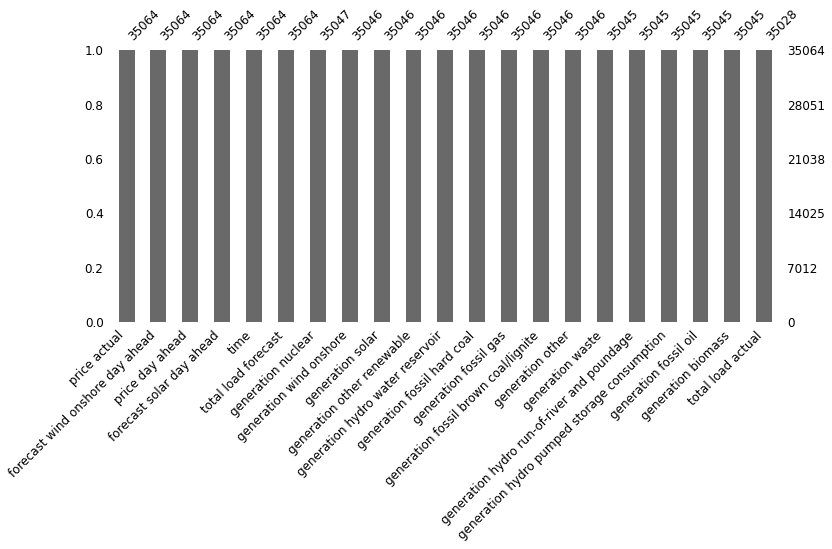

In [13]:
msno.bar(energy_data,figsize=(12,5),
         inline=True,
         sort="descending",
        fontsize=12);

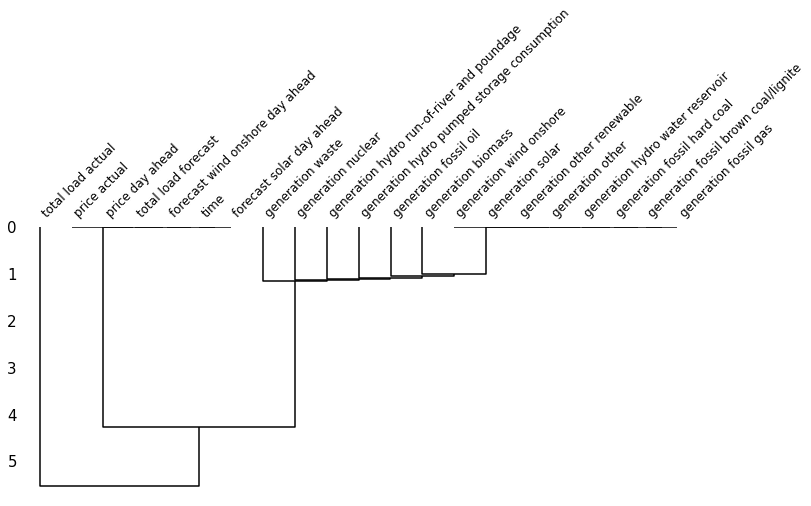

In [14]:
msno.dendrogram(df=energy_data,figsize=(12,5),fontsize=12);

In [15]:
weather_val=weather_data.query("city_name == 'Valencia'")

weather_val.shape, energy_data.shape

((35145, 17), (35064, 21))

In [16]:
weather_val[weather_val.duplicated(subset="dt_iso",
                                   keep="first")].shape

(81, 17)

In [17]:
weather_val=weather_val.rename({"dt_iso":"time"},axis=1)

In [18]:
print(weather_val.time.min(),weather_val.time.max())
print(energy_data.time.min(),energy_data.time.max())

2015-01-01 00:00:00+01:00 2018-12-31 23:00:00+01:00
2015-01-01 00:00:00+01:00 2018-12-31 23:00:00+01:00


In [19]:
weather_val=weather_val.drop_duplicates(subset="time",
                                        keep="first")
weather_val.shape

(35064, 17)

In [20]:
full_df=pd.merge(energy_data,weather_val,on="time")
full_df.shape

(35064, 37)

In [21]:
full_df.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2015-01-01 00:00:00+01:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,17.0,6436.0,26118.0,25385.0,50.10,65.41,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
1,2015-01-01 01:00:00+01:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,16.0,5856.0,24934.0,24382.0,48.10,64.92,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2,2015-01-01 02:00:00+01:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,8.0,5454.0,23515.0,22734.0,47.33,64.48,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
3,2015-01-01 03:00:00+01:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,2.0,5151.0,22642.0,21286.0,42.27,59.32,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
4,2015-01-01 04:00:00+01:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,9.0,4861.0,21785.0,20264.0,38.41,56.04,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n


In [22]:
full_df.dtypes.to_frame().T

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,float64,float64,float64,int64,int64,int64,int64,float64,float64,float64,int64,int64,object,object,object


In [23]:
dates = full_df["time"].str.split(" ",n=1,expand=True)[0]
times = full_df["time"].str.split(" ",n=1,expand=True)[1]

full_df["date"] = dates
full_df["hours"] = times.str.split("+",n=1,expand=True)[0]

full_df["full_time"]=full_df["date"] + " " + full_df["hours"]

full_df["full_time"]=pd.to_datetime(full_df["full_time"],
                                    format='%Y-%m-%d %H:%M')

full_df["full_time"].head()

0   2015-01-01 00:00:00
1   2015-01-01 01:00:00
2   2015-01-01 02:00:00
3   2015-01-01 03:00:00
4   2015-01-01 04:00:00
Name: full_time, dtype: datetime64[ns]

In [24]:
full_df.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon,date,hours,full_time
0,2015-01-01 00:00:00+01:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,17.0,6436.0,26118.0,25385.0,50.10,65.41,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2015-01-01,00:00:00,2015-01-01 00:00:00
1,2015-01-01 01:00:00+01:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,16.0,5856.0,24934.0,24382.0,48.10,64.92,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2015-01-01,01:00:00,2015-01-01 01:00:00
2,2015-01-01 02:00:00+01:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,8.0,5454.0,23515.0,22734.0,47.33,64.48,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2015-01-01,02:00:00,2015-01-01 02:00:00
3,2015-01-01 03:00:00+01:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,2.0,5151.0,22642.0,21286.0,42.27,59.32,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2015-01-01,03:00:00,2015-01-01 03:00:00
4,2015-01-01 04:00:00+01:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,9.0,4861.0,21785.0,20264.0,38.41,56.04,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2015-01-01,04:00:00,2015-01-01 04:00:00


In [25]:
def extract_from_date(data,time_column):
    
    data["year"]=data[time_column].dt.year
    data["quarter"]=data[time_column].dt.quarter
    data["month"]=data[time_column].dt.month
    data["week"]=data[time_column].dt.week
    data["hour"]=data[time_column].dt.hour
    data["time"]=data[time_column].dt.time
    data['dayofweek'] = data[time_column].dt.dayofweek
    data["dayofmonth"]=data[time_column].dt.day
    data["day_name"]=data[time_column].dt.day_name()
    data['is_weekend'] = np.where(data['day_name'].isin(['Sunday', 'Saturday']), 1,0)
    data["is_year_start"]=data[time_column].dt.is_year_start
    
    return data

full_df=extract_from_date(full_df,"full_time")

full_df.sample(5)

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon,date,hours,full_time,year,quarter,month,week,hour,dayofweek,dayofmonth,day_name,is_weekend,is_year_start
26838,06:00:00,364.0,603.0,6210.0,4623.0,279.0,306.0,1063.0,1253.0,7104.0,56.0,97.0,25.0,323.0,4178.0,12.0,4144.0,27354.0,27297.0,53.48,57.22,Valencia,281.150,281.150,281.150,1025,65,2,270,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2018-01-23,06:00:00,2018-01-23 06:00:00,2018,1,1,4,6,1,23,Tuesday,0,False
14666,03:00:00,358.0,0.0,3097.0,1228.0,315.0,470.0,1470.0,4253.0,7114.0,87.0,64.0,66.0,207.0,7420.0,54.0,7229.0,24435.0,24149.0,20.08,48.61,Valencia,294.430,292.590,296.150,1020,78,1,260,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2016-09-03,03:00:00,2016-09-03 03:00:00,2016,3,9,35,3,5,3,Saturday,1,False
31685,06:00:00,361.0,401.0,5816.0,3536.0,261.0,0.0,848.0,1118.0,6968.0,58.0,88.0,30.0,327.0,2055.0,145.0,2606.0,24788.0,24270.0,62.14,66.64,Valencia,296.150,296.150,296.150,1013,83,2,300,0.0,0.0,0.0,20,801,clouds,few clouds,02n,2018-08-13,06:00:00,2018-08-13 06:00:00,2018,3,8,33,6,0,13,Monday,0,False
21363,04:00:00,402.0,611.0,4870.0,2166.0,314.0,477.0,399.0,263.0,6809.0,49.0,94.0,393.0,339.0,5707.0,360.0,5590.0,24585.0,24432.0,38.55,50.03,Valencia,294.150,294.150,294.150,1014,83,1,320,0.0,0.0,0.0,20,801,clouds,few clouds,02n,2017-06-09,04:00:00,2017-06-09 04:00:00,2017,2,6,23,4,4,9,Friday,0,False
16097,17:00:00,391.0,0.0,3523.0,1176.0,368.0,893.0,1212.0,5169.0,6080.0,89.0,72.0,258.0,184.0,14797.0,274.0,15171.0,33049.0,32671.0,37.21,61.07,Valencia,293.485,293.485,293.485,993,55,1,184,0.0,0.0,0.0,0,800,clear,sky is clear,01d,2016-11-01,17:00:00,2016-11-01 17:00:00,2016,4,11,44,17,1,1,Tuesday,0,False


In [26]:
full_df.dtypes.to_frame().T

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon,date,hours,full_time,year,quarter,month,week,hour,dayofweek,dayofmonth,day_name,is_weekend,is_year_start
0,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,float64,float64,float64,int64,int64,int64,int64,float64,float64,float64,int64,int64,object,object,object,object,object,datetime64[ns],int64,int64,int64,int64,int64,int64,int64,object,int64,bool


In [27]:
train=full_df.loc[~((full_df["year"]==2018) & (full_df["month"]==12))]

test=full_df.loc[((full_df["year"]==2018) & (full_df["month"]==12))] 

In [28]:
fig = make_subplots()

fig.add_trace(
    go.Line(x=train["full_time"],y=train["price actual"],
                                name="price actual"))

fig.add_trace(
    go.Line(x=train["full_time"],y=train.rolling(window=24).mean()["price actual"],
                                        name="rolling window=24h"))

fig.add_trace(
    go.Line(x=train["full_time"],y=train.rolling(window=168).mean()["price actual"],
                                        name="rolling window=168h"))

fig.update_xaxes(rangeslider_visible=True)

fig.show()

In [29]:
train.corr().abs()["price actual"].nlargest(20).to_frame(name="corr")

,corr
price actual,1.000000
price day ahead,0.730978
generation fossil hard coal,0.477277
generation fossil gas,0.458438
total load forecast,0.436595
total load actual,0.436587
generation hydro pumped storage consumption,0.426019
generation fossil brown coal/lignite,0.369509
generation fossil oil,0.295739
hour,0.285920


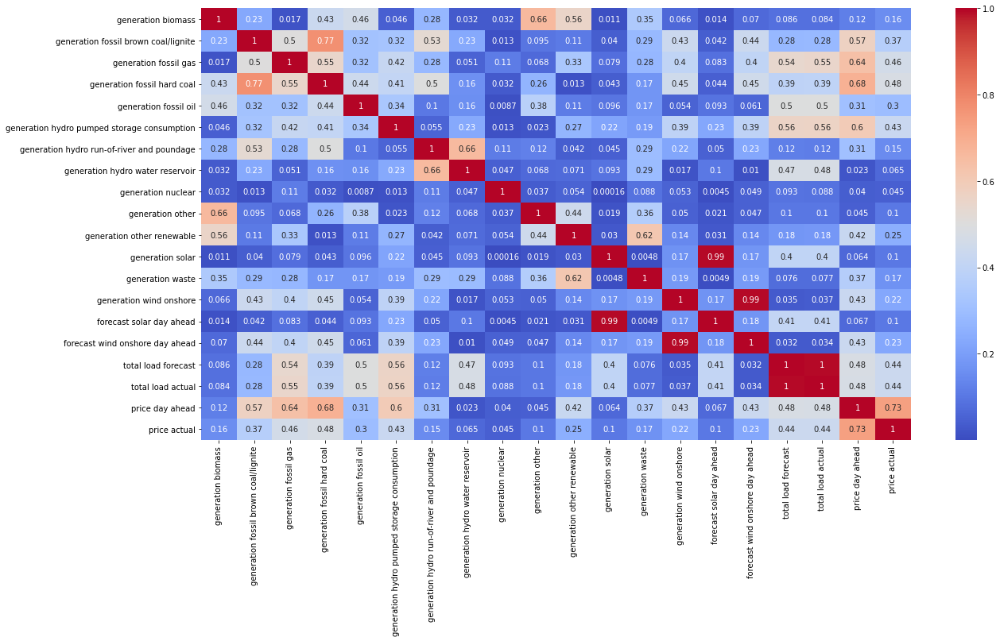

In [30]:
plt.figure(figsize=(20,10));
sns.heatmap(train.iloc[:,:21].corr().abs(),
            annot=True,
            cmap="coolwarm");

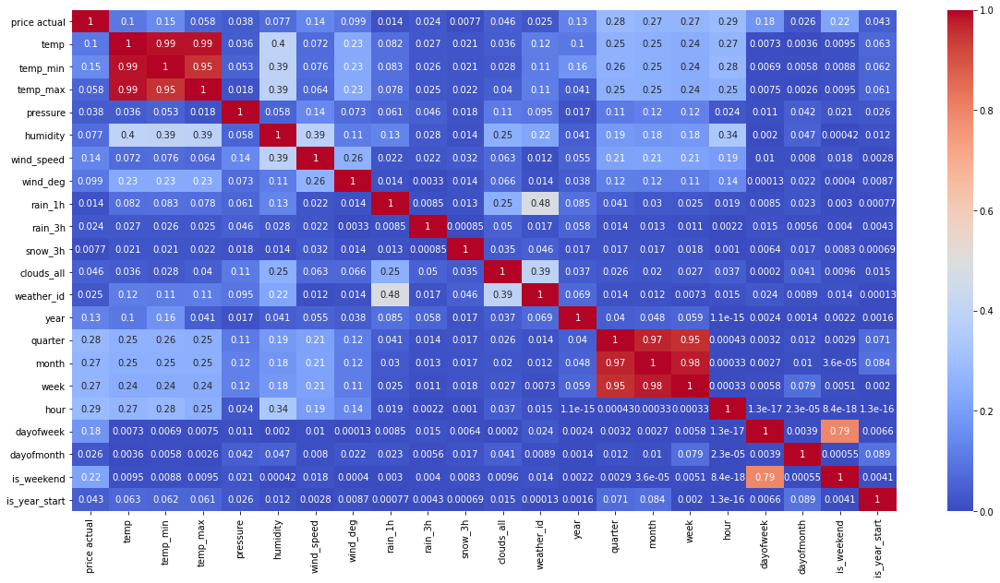

In [31]:
plt.figure(figsize=(20,10));
sns.heatmap(train.iloc[:,20:].corr().abs(),
            annot=True,
            cmap="coolwarm");

In [32]:
fig = ff.create_distplot([train["price actual"]],
                         group_labels=["distplot"])
fig.show()

fig=px.box(train["price actual"],
           orientation="h",
           title="Actual Price Boxplot")
fig.show()
#fig.update_traces(marker=dict(line=dict(width=2)))

In [33]:
train.isnull().sum().to_frame().T

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon,date,hours,full_time,year,quarter,month,week,hour,dayofweek,dayofmonth,day_name,is_weekend,is_year_start
0,0,19,18,18,18,19,19,19,18,17,18,18,18,19,18,0,0,0,36,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [34]:
train.iloc[:,:21].describe().T

,count,mean,std,min,25%,50%,75%,max
generation biomass,34301.0,384.887671,85.612554,0.00,335.00,368.000,439.00,592.00
generation fossil brown coal/lignite,34302.0,448.966503,356.136548,0.00,0.00,511.000,762.00,999.00
generation fossil gas,34302.0,5604.500816,2200.409367,0.00,4118.00,4951.000,6392.75,20034.00
generation fossil hard coal,34302.0,4275.376246,1967.330152,0.00,2532.00,4503.000,5861.75,8359.00
generation fossil oil,34301.0,298.955278,52.508935,0.00,263.00,301.000,330.00,449.00
generation hydro pumped storage consumption,34301.0,478.513863,794.910956,0.00,0.00,69.000,621.00,4523.00
generation hydro run-of-river and poundage,34301.0,966.125448,401.090912,0.00,633.00,893.000,1243.00,2000.00
generation hydro water reservoir,34302.0,2601.689727,1838.733976,0.00,1068.00,2160.000,3755.00,9477.00
generation nuclear,34303.0,6273.509985,840.733144,0.00,5802.00,6622.000,7030.00,7117.00
generation other,34302.0,60.303364,20.410143,0.00,53.00,57.000,80.00,106.00


In [35]:
train.describe(include="O").T

,count,unique,top,freq
time,34320,24,22:00:00,1430
city_name,34320,1,Valencia,34320
weather_main,34320,8,clouds,17144
weather_description,34320,23,sky is clear,15025
weather_icon,34320,21,01n,7543
date,34320,1430,2017-10-29,25
hours,34320,24,19:00:00,1430
day_name,34320,7,Thursday,4920


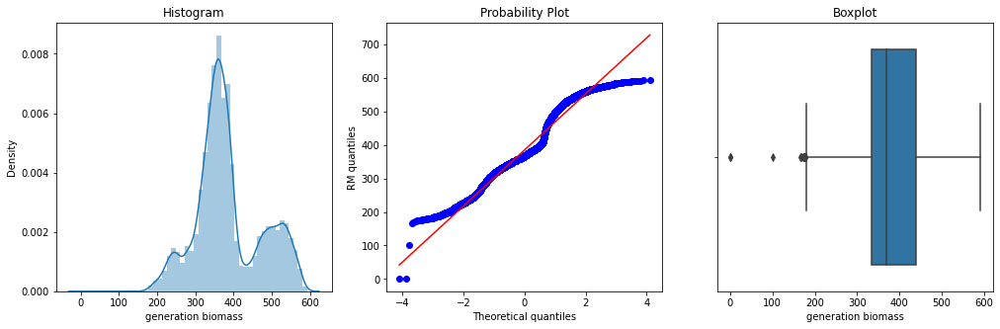

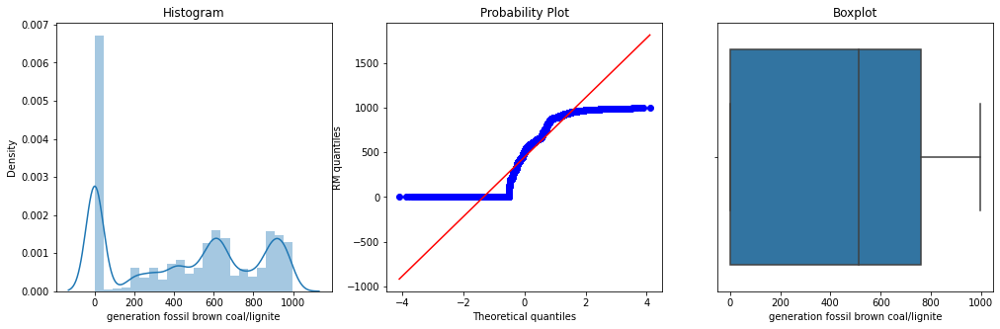

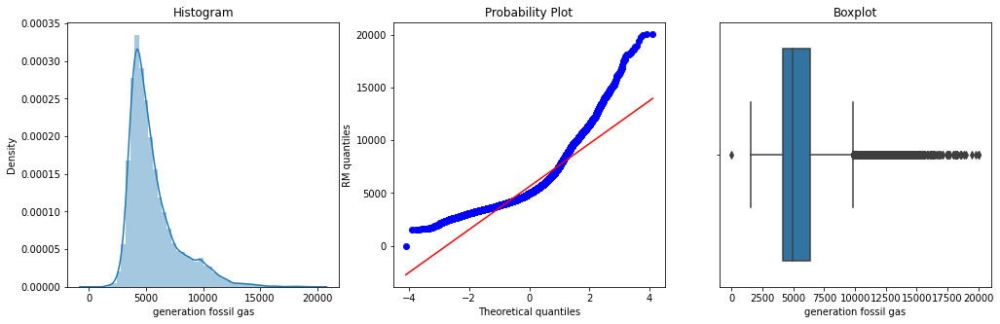

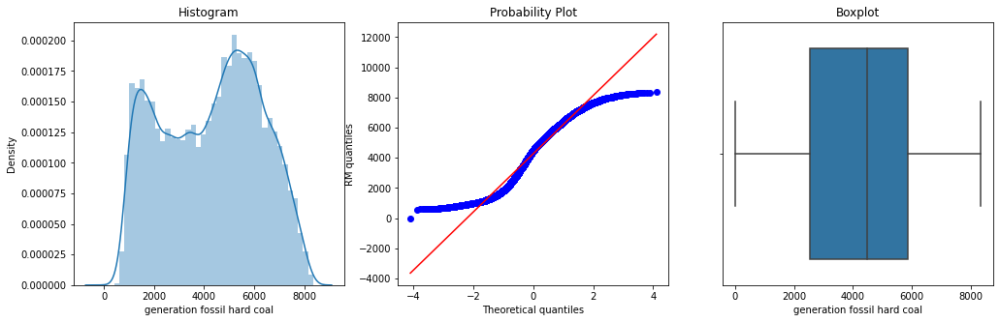

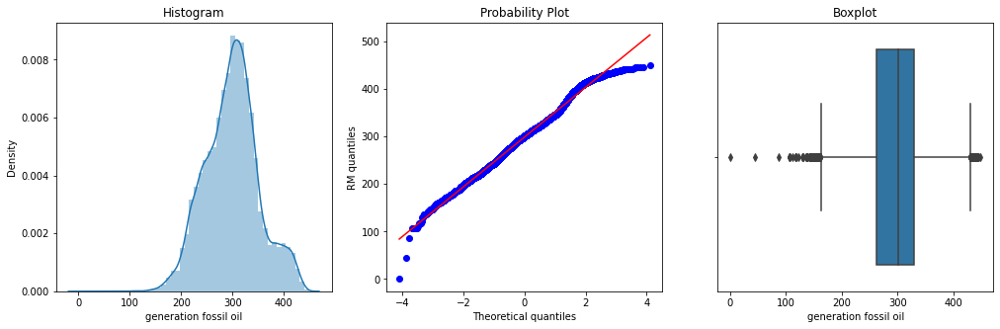

...

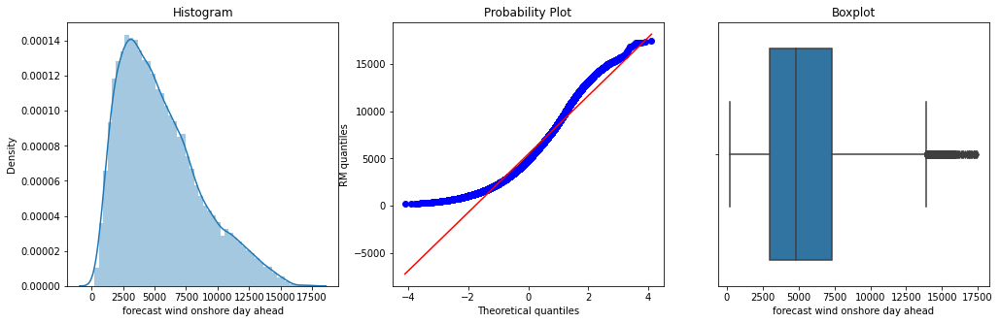

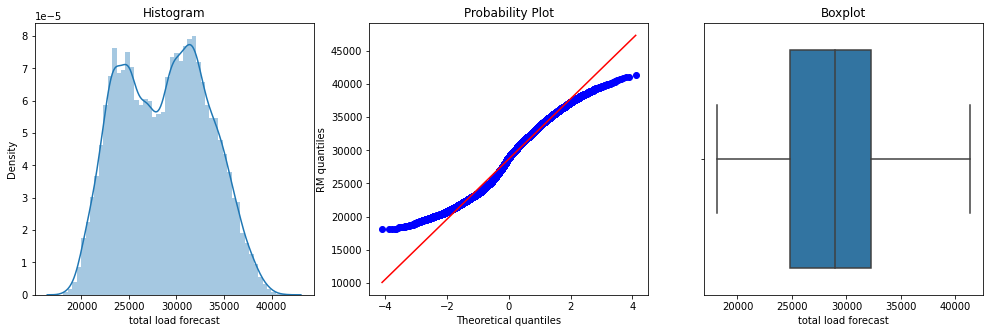

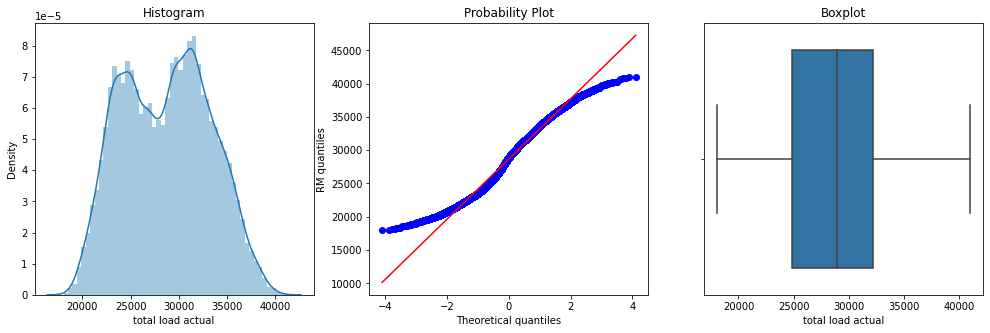

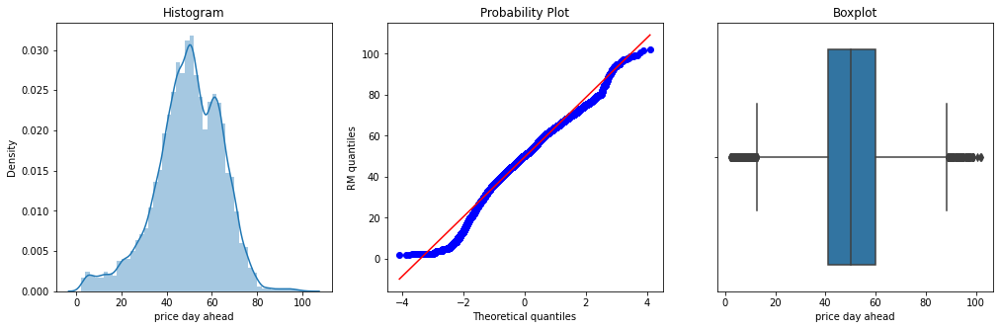

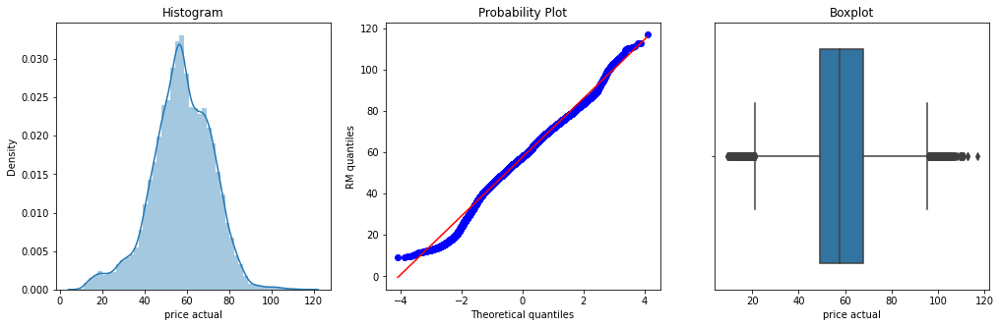

In [36]:
def diagnostic_plots(df, variable):
    
    plt.figure(figsize=(17, 5))

    plt.subplot(1, 3, 1)
    sns.distplot(df[variable])
    plt.title('Histogram')
    
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('RM quantiles')

    plt.subplot(1, 3, 3)
    sns.boxplot(x=df[variable])
    plt.title('Boxplot')
    
    plt.show()
    
    
for col in train.select_dtypes(exclude="O").columns[:20].to_list():
        diagnostic_plots(train.dropna(),col)

In [37]:
fig = make_subplots()

fig.add_trace(
    go.Line(x=train.loc[train["year"]==2018,"full_time"],
            y=train.loc[train["year"]==2018,"price actual"],
                                name="price actual"))

fig.add_trace(
    go.Line(x=train.loc[train["year"]==2018,"full_time"],
            y=train.loc[train["year"]==2018,"temp"],
                                name="Temp"))
fig.add_trace(
    go.Line(x=train.loc[train["year"]==2018,"full_time"],
            y=train.loc[train["year"]==2018,"generation waste"],
                                name="generation waste"))
fig.add_trace(
    go.Line(x=train.loc[train["year"]==2018,"full_time"],
            y=train.loc[train["year"]==2018,"generation fossil oil"],
                                name="generation fossil oil"))

fig.update_xaxes(rangeslider_visible=True)

fig.show()

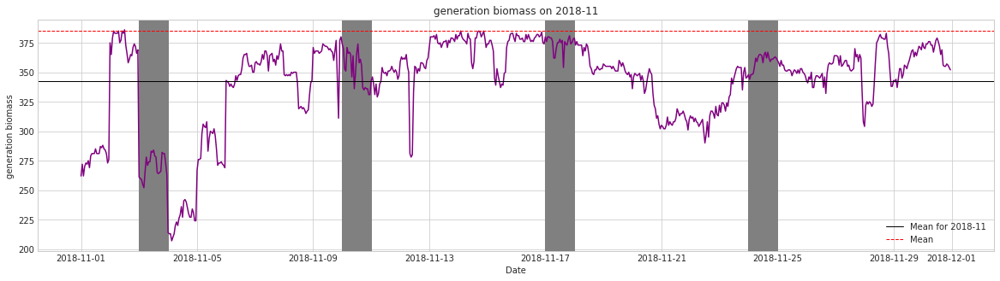

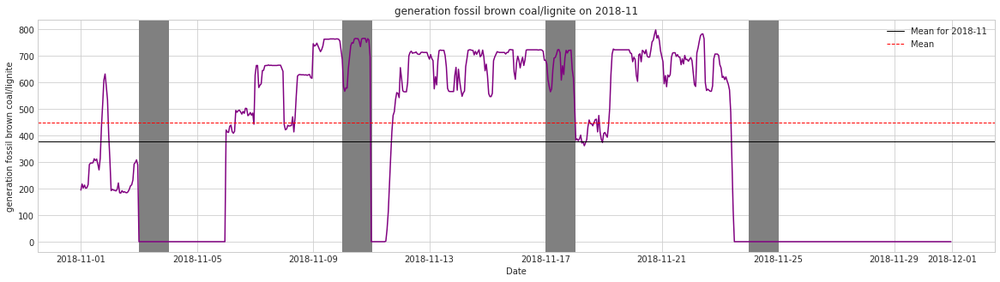

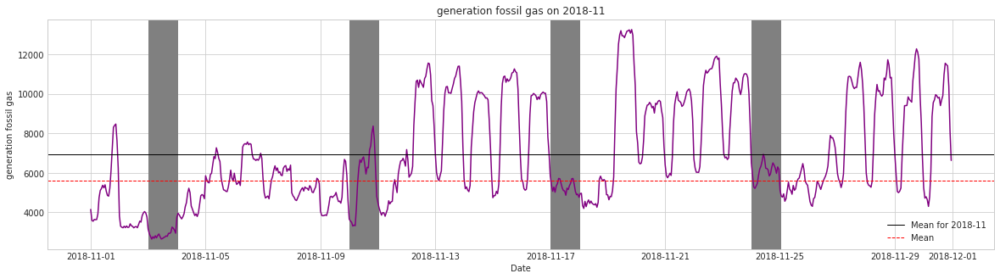

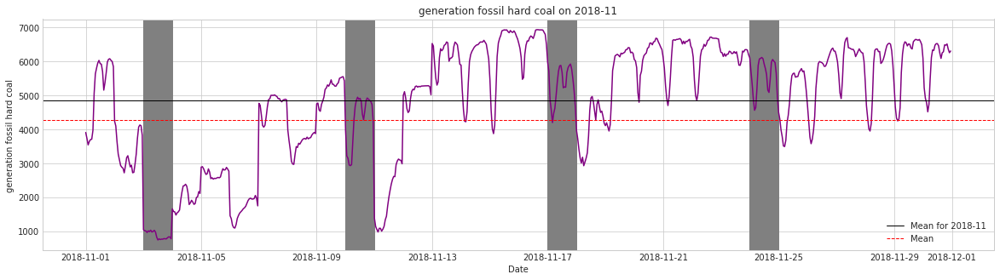

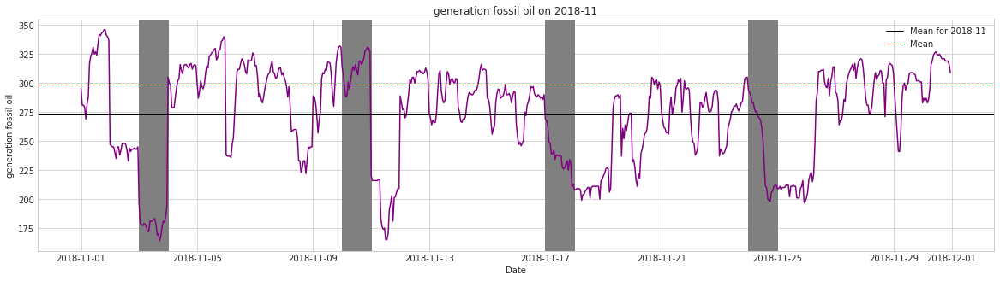

...

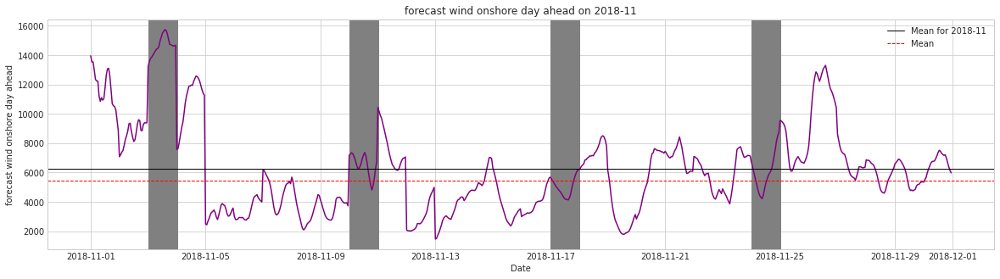

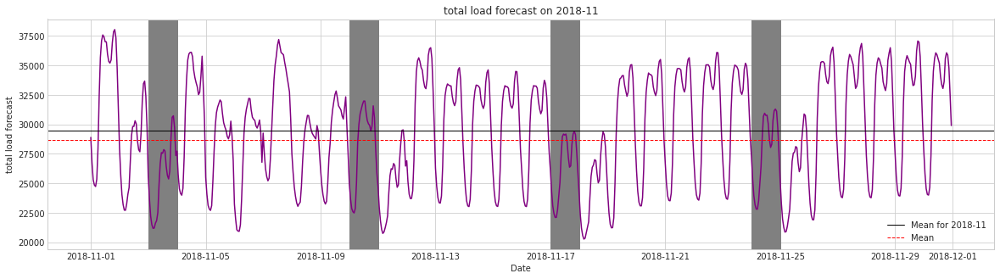

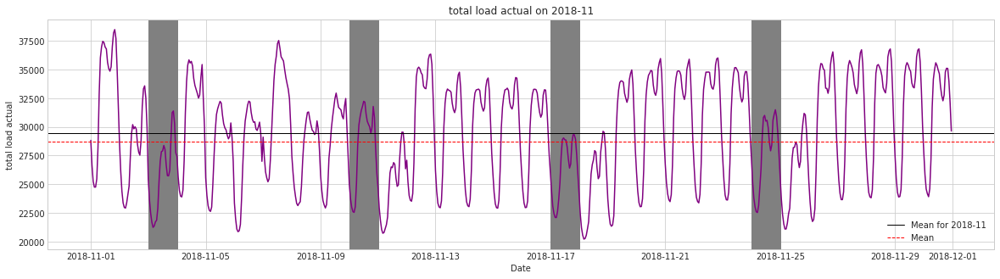

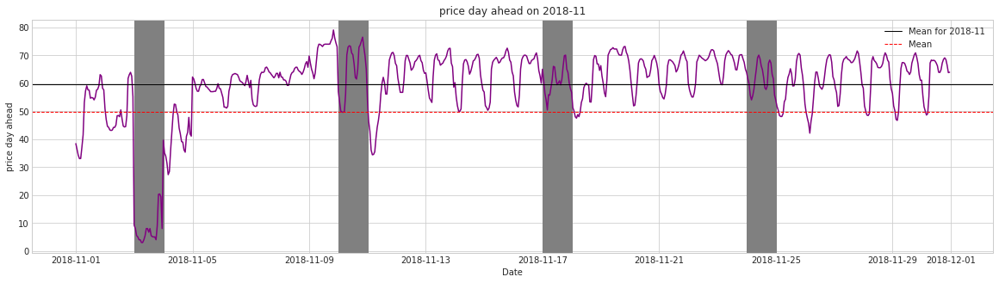

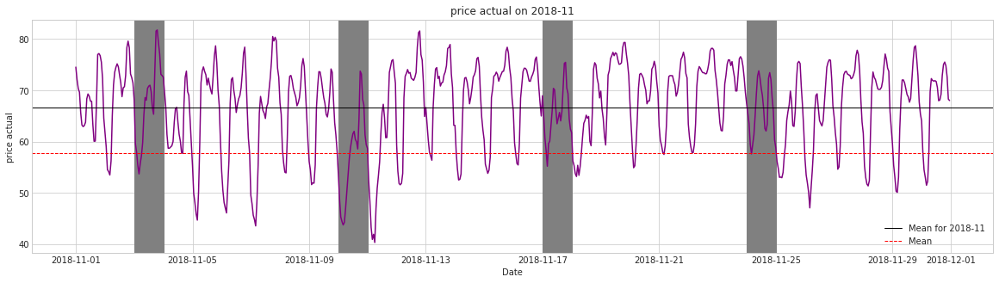

In [38]:
columns_to_plot=train.select_dtypes(exclude="O").columns[:20]

for col in columns_to_plot:
    
    with plt.style.context('seaborn-whitegrid'):
        
        plt.figure(figsize=(20,5));
        plt.plot(train["full_time"].tail(720),
                 train[col].tail(720),color="purple");
        
        plt.axhline(train[col].tail(720).mean(), 
                                                color='black',
                                                linestyle='-',
                                                linewidth=1,
                                                label="Mean for 2018-11"); #mean
        
        plt.axhline(train[col].mean(), 
                            color='red',
                            linestyle='--',
                            linewidth=1,
                            label="Mean"); # general mean
        
        plt.axvspan("2018-11-03","2018-11-04",color="gray") #weekends
        plt.axvspan("2018-11-10","2018-11-11",color="gray")
        plt.axvspan("2018-11-17","2018-11-18",color="gray")
        plt.axvspan("2018-11-24","2018-11-25",color="gray")

        plt.xlabel("Date")
        plt.ylabel(col)
        plt.title(f"{col} on 2018-11")
        plt.legend()
        plt.show();

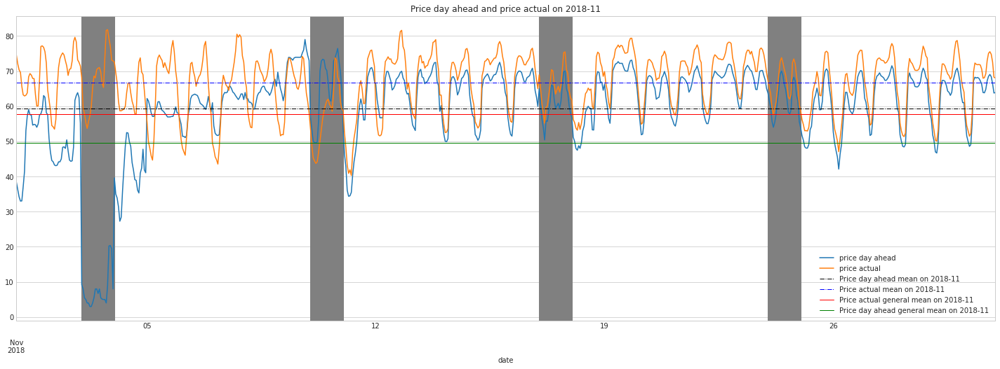

In [39]:
with plt.style.context('seaborn-whitegrid'):
    fig, ax = plt.subplots(figsize=(25,8))

    ax.set_title('Price day ahead and price actual on 2018-11')
    ax = train.tail(720).plot.line(x="full_time",y=['price day ahead',"price actual"],ax=ax)
    ax.set_xlabel("date")
    plt.axvspan("2018-11-03","2018-11-04",color="gray") #weekends
    plt.axvspan("2018-11-10","2018-11-11",color="gray")
    plt.axvspan("2018-11-17","2018-11-18",color="gray")
    plt.axvspan("2018-11-24","2018-11-25",color="gray")

    ax.axhline(train["price day ahead"].tail(720).mean(), 
                                color='black',
                                linestyle='-.',
                                linewidth=1,
                                label="Price day ahead mean on 2018-11"); 
    
    ax.axhline(train["price actual"].tail(720).mean(), 
                                color='blue',
                                linestyle='-.',
                                linewidth=1,
                                label="Price actual mean on 2018-11"); 
    
    ax.axhline(train["price actual"].mean(), 
                                color='red',
                                linestyle='-',
                                linewidth=1,
                                label="Price actual general mean on 2018-11"); 
    
    ax.axhline(train["price day ahead"].mean(), 
                                color='green',
                                linestyle='-',
                                linewidth=1,
                                label="Price day ahead general mean on 2018-11"); 
    plt.legend()

    

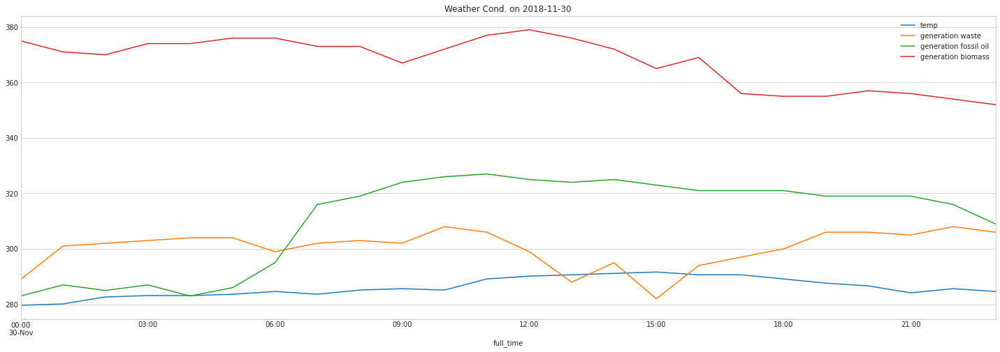

In [40]:
with plt.style.context('seaborn-whitegrid'):
    fig, ax = plt.subplots(figsize=(25,8))

    ax.set_title('Weather Cond. on 2018-11-30')
    ax = train.tail(24).plot.line(x="full_time",
                                  y=["temp","generation waste",
                                   "generation fossil oil",
                                  "generation biomass"],
                                        ax=ax)
 

In [41]:
def plot_actual_price(price_col,other_col,train):
    
    mean_price=train[price_col].mean()
    
    train.groupby([other_col])[price_col].mean().plot.bar(figsize=(20,6),
                                                            color="cornflowerblue");
    plt.axhline(train[price_col].mean(),
                                    linestyle='-',
                                    linewidth=2,
                                    color="red");

    plt.axhline(mean_price + train[price_col].std(),
                                    linestyle=':',
                                    linewidth=2,
                                    color="red");

    plt.axhline(mean_price - train[price_col].std(),
                                    linestyle=':',
                                    linewidth=2,
                                    color="red");
    plt.title(f"{price_col}&{other_col} BarPlot");
    plt.show()


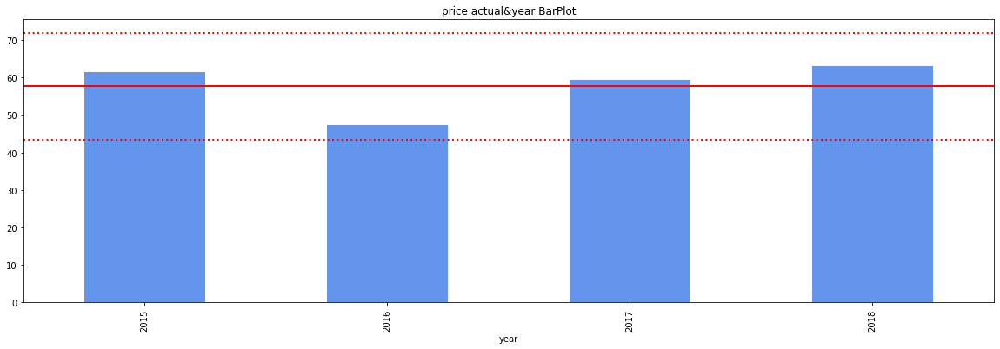

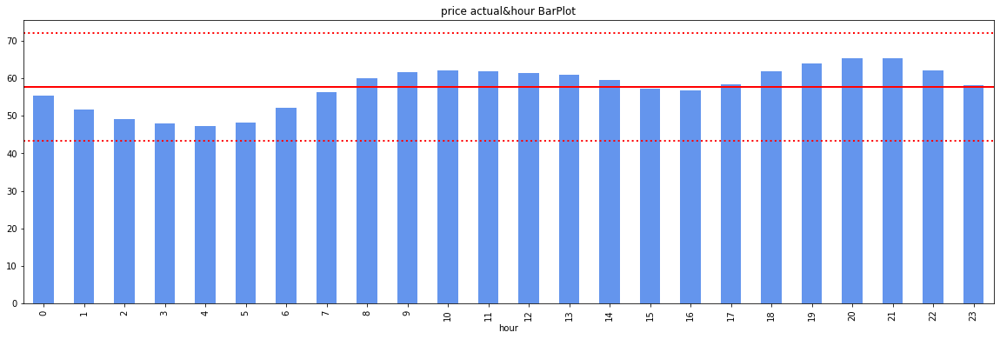

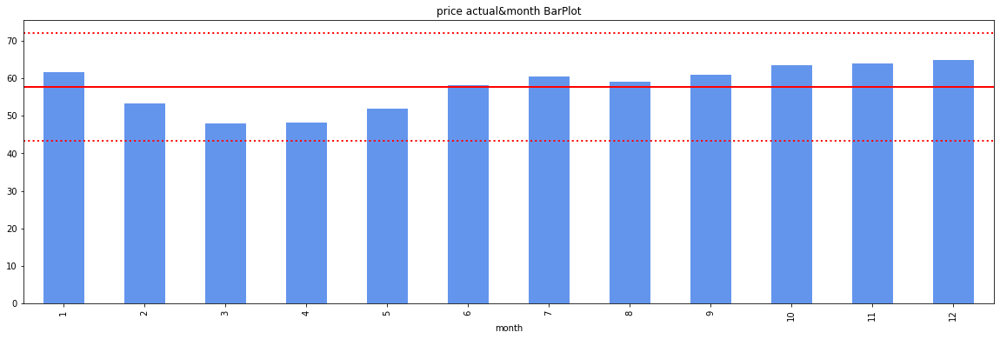

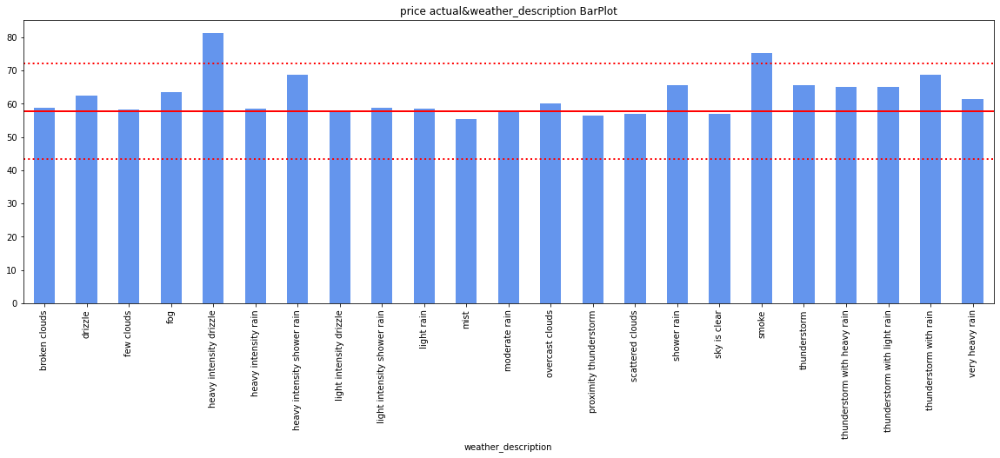

In [42]:
for col in ["year","hour","month","weather_description"]:
    plot_actual_price("price actual",col,train)

In [43]:
fig = px.scatter(train, x="total load actual", y="price actual", trendline="ols")
fig.show()
results = px.get_trendline_results(fig)
results.px_fit_results.iloc[0].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.191
Model:                            OLS   Adj. R-squared:                  0.191
Method:                 Least Squares   F-statistic:                     8073.
Date:                Tue, 29 Jun 2021   Prob (F-statistic):               0.00
Time:                        20:34:24   Log-Likelihood:            -1.3608e+05
No. Observations:               34284   AIC:                         2.722e+05
Df Residuals:                   34282   BIC:                         2.722e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         18.6263      0.440     42.310      0.000      17.763      19.489
x1             0.0014   1.52e-05     89.851      0.000       0.001       0.001
==============================================================================
Omnibus:                     1262.806   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1483.717
Skew:                          -0.444   Prob(JB):                         0.00
Kurtosis:                       3.501   Cond. No.                     1.85e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.85e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

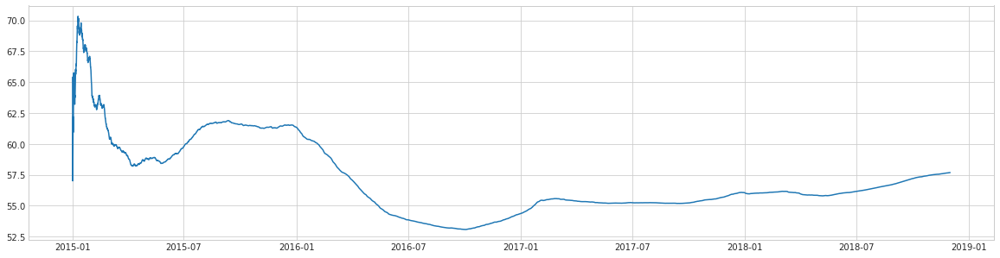

In [44]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(20,5));
    plt.plot(train["full_time"],train["price actual"].expanding().mean())
     #average of all prior rows

In [45]:
missing_df=train[train.isna().any(axis=1)]
missing_df.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon,date,hours,full_time,year,quarter,month,week,hour,dayofweek,dayofmonth,day_name,is_weekend,is_year_start
99,03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,546.0,8233.0,21912.0,21182.0,35.2,59.68,Valencia,273.553,273.553,273.553,1003,84,2,317,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2015-01-05,03:00:00,2015-01-05 03:00:00,2015,1,1,2,3,0,5,Monday,0,False
108,12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3932.0,9258.0,23209.0,NaN,35.5,79.14,Valencia,286.983,286.983,286.983,1001,68,1,201,0.0,0.0,0.0,0,800,clear,sky is clear,01d,2015-01-05,12:00:00,2015-01-05 12:00:00,2015,1,1,2,12,0,5,Monday,0,False
109,13:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4236.0,9156.0,23725.0,NaN,36.8,73.95,Valencia,286.983,286.983,286.983,1001,68,1,201,0.0,0.0,0.0,0,800,clear,sky is clear,01d,2015-01-05,13:00:00,2015-01-05 13:00:00,2015,1,1,2,13,0,5,Monday,0,False
110,14:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4215.0,9072.0,23614.0,NaN,32.5,71.93,Valencia,288.058,288.058,288.058,998,63,1,199,0.0,0.0,0.0,0,800,clear,sky is clear,01d,2015-01-05,14:00:00,2015-01-05 14:00:00,2015,1,1,2,14,0,5,Monday,0,False
111,15:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4050.0,8779.0,22381.0,NaN,30.0,71.50,Valencia,287.702,287.702,287.702,1013,64,1,174,0.0,0.0,0.0,0,800,clear,sky is clear,01,2015-01-05,15:00:00,2015-01-05 15:00:00,2015,1,1,2,15,0,5,Monday,0,False


In [46]:
miss_cols=miss_frame(train).index.to_list()
miss_index=missing_df.index.to_list()
miss_cols

['total load actual',
 'generation biomass',
 'generation fossil oil',
 'generation hydro pumped storage consumption',
 'generation hydro run-of-river and poundage',
 'generation waste',
 'generation fossil brown coal/lignite',
 'generation fossil gas',
 'generation fossil hard coal',
 'generation hydro water reservoir',
 'generation other',
 'generation other renewable',
 'generation solar',
 'generation wind onshore',
 'generation nuclear']

In [47]:
train_new=train.copy()
test_new=test.copy()


for var in miss_cols:  #missing_indicator
    
    train_new[var+'_NA'] = np.where(train_new[var].isnull(), 1, 0)
    
    test_new[var+'_NA'] = np.where(test_new[var].isnull(), 1, 0)
   
train_new.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon,date,hours,full_time,year,quarter,month,week,hour,dayofweek,dayofmonth,day_name,is_weekend,is_year_start,total load actual_NA,generation biomass_NA,generation fossil oil_NA,generation hydro pumped storage consumption_NA,generation hydro run-of-river and poundage_NA,generation waste_NA,generation fossil brown coal/lignite_NA,generation fossil gas_NA,generation fossil hard coal_NA,generation hydro water reservoir_NA,generation other_NA,generation other renewable_NA,generation solar_NA,generation wind onshore_NA,generation nuclear_NA
0,00:00:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,17.0,6436.0,26118.0,25385.0,50.10,65.41,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2015-01-01,00:00:00,2015-01-01 00:00:00,2015,1,1,1,0,3,1,Thursday,0,True,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,01:00:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,16.0,5856.0,24934.0,24382.0,48.10,64.92,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2015-01-01,01:00:00,2015-01-01 01:00:00,2015,1,1,1,1,3,1,Thursday,0,True,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,02:00:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,8.0,5454.0,23515.0,22734.0,47.33,64.48,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2015-01-01,02:00:00,2015-01-01 02:00:00,2015,1,1,1,2,3,1,Thursday,0,True,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,03:00:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,2.0,5151.0,22642.0,21286.0,42.27,59.32,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2015-01-01,03:00:00,2015-01-01 03:00:00,2015,1,1,1,3,3,1,Thursday,0,True,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,04:00:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,9.0,4861.0,21785.0,20264.0,38.41,56.04,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2015-01-01,04:00:00,2015-01-01 04:00:00,2015,1,1,1,4,3,1,Thursday,0,True,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [48]:
train_new=train_new.interpolate(method='linear', limit_direction='forward', axis=0)

In [49]:
display(train["price actual"].describe().to_frame().T)
display(train_new["price actual"].describe().to_frame().T)

,count,mean,std,min,25%,50%,75%,max
price actual,34320.0,57.68548,14.25231,9.33,49.12,57.795,67.73,116.8


,count,mean,std,min,25%,50%,75%,max
price actual,34320.0,57.68548,14.25231,9.33,49.12,57.795,67.73,116.8


In [50]:
train_new.iloc[miss_index].head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon,date,hours,full_time,year,quarter,month,week,hour,dayofweek,dayofmonth,day_name,is_weekend,is_year_start,total load actual_NA,generation biomass_NA,generation fossil oil_NA,generation hydro pumped storage consumption_NA,generation hydro run-of-river and poundage_NA,generation waste_NA,generation fossil brown coal/lignite_NA,generation fossil gas_NA,generation fossil hard coal_NA,generation hydro water reservoir_NA,generation other_NA,generation other renewable_NA,generation solar_NA,generation wind onshore_NA,generation nuclear_NA
99,03:00:00,346.500000,0.0,4590.500000,2576.500000,309.500000,1544.000000,1029.000000,2335.500000,4029.000000,38.000000,73.000000,616.000000,155.5,8117.500000,546.0,8233.0,21912.0,21182.0,35.2,59.68,Valencia,273.553,273.553,273.553,1003,84,2,317,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2015-01-05,03:00:00,2015-01-05 03:00:00,2015,1,1,2,3,0,5,Monday,0,False,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
108,12:00:00,375.142857,0.0,3914.714286,2392.714286,333.428571,1176.857143,1207.857143,2201.428571,3812.285714,37.714286,73.571429,3282.571429,154.0,8888.142857,3932.0,9258.0,23209.0,24066.0,35.5,79.14,Valencia,286.983,286.983,286.983,1001,68,1,201,0.0,0.0,0.0,0,800,clear,sky is clear,01d,2015-01-05,12:00:00,2015-01-05 12:00:00,2015,1,1,2,12,0,5,Monday,0,False,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
109,13:00:00,374.285714,0.0,3929.428571,2363.428571,333.857143,1187.714286,1209.714286,2193.857143,3795.571429,38.428571,73.142857,3226.142857,153.0,8645.285714,4236.0,9156.0,23725.0,23703.0,36.8,73.95,Valencia,286.983,286.983,286.983,1001,68,1,201,0.0,0.0,0.0,0,800,clear,sky is clear,01d,2015-01-05,13:00:00,2015-01-05 13:00:00,2015,1,1,2,13,0,5,Monday,0,False,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
110,14:00:00,373.428571,0.0,3944.142857,2334.142857,334.285714,1198.571429,1211.571429,2186.285714,3778.857143,39.142857,72.714286,3169.714286,152.0,8402.428571,4215.0,9072.0,23614.0,23340.0,32.5,71.93,Valencia,288.058,288.058,288.058,998,63,1,199,0.0,0.0,0.0,0,800,clear,sky is clear,01d,2015-01-05,14:00:00,2015-01-05 14:00:00,2015,1,1,2,14,0,5,Monday,0,False,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
111,15:00:00,372.571429,0.0,3958.857143,2304.857143,334.714286,1209.428571,1213.428571,2178.714286,3762.142857,39.857143,72.285714,3113.285714,151.0,8159.571429,4050.0,8779.0,22381.0,22977.0,30.0,71.50,Valencia,287.702,287.702,287.702,1013,64,1,174,0.0,0.0,0.0,0,800,clear,sky is clear,01,2015-01-05,15:00:00,2015-01-05 15:00:00,2015,1,1,2,15,0,5,Monday,0,False,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [51]:
display(train["weather_main"].value_counts(normalize=True).to_frame().T)
display(train["weather_icon"].value_counts(normalize=True).to_frame().T)
display(train["weather_id"].value_counts(normalize=True).to_frame().T)

,clouds,clear,rain,mist,thunderstorm,drizzle,fog,smoke
weather_main,0.499534,0.437791,0.051515,0.004604,0.003788,0.001369,0.001224,0.000175


,01n,02d,01d,02n,03d,04d,04n,01,03n,02,10n,10d,10,03,04,50n,11d,09n,09d,50d,11n
weather_icon,0.219784,0.193328,0.161538,0.113928,0.046416,0.042279,0.03986,0.038462,0.037966,0.022815,0.016754,0.016259,0.015763,0.011509,0.009441,0.004487,0.00236,0.002214,0.001894,0.001515,0.001428


,800,801,802,803,500,804,501,701,502,211,520,741,300,200,521,201,522,202,711,503,301,302
weather_id,0.437791,0.312063,0.095892,0.080332,0.03412,0.011247,0.011131,0.004604,0.003351,0.002214,0.001603,0.001224,0.001195,0.000816,0.000787,0.000554,0.00035,0.000204,0.000175,0.000175,0.000146,0.000029


In [52]:
train_new=train_new.drop(["time","city_name","date","hours","full_time","day_name",
                         "weather_id","weather_icon","is_year_start"],axis=1)
test_new=test_new.drop(["time","city_name","date","hours","full_time","day_name",
                        "weather_id","weather_icon","is_year_start"],axis=1)

In [53]:
train_new.shape, test_new.shape

((34320, 56), (744, 56))

In [54]:
train_new.head()

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_main,weather_description,year,quarter,month,week,hour,dayofweek,dayofmonth,is_weekend,total load actual_NA,generation biomass_NA,generation fossil oil_NA,generation hydro pumped storage consumption_NA,generation hydro run-of-river and poundage_NA,generation waste_NA,generation fossil brown coal/lignite_NA,generation fossil gas_NA,generation fossil hard coal_NA,generation hydro water reservoir_NA,generation other_NA,generation other renewable_NA,generation solar_NA,generation wind onshore_NA,generation nuclear_NA
0,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,17.0,6436.0,26118.0,25385.0,50.10,65.41,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,clear,sky is clear,2015,1,1,1,0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,16.0,5856.0,24934.0,24382.0,48.10,64.92,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,clear,sky is clear,2015,1,1,1,1,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,8.0,5454.0,23515.0,22734.0,47.33,64.48,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,clear,sky is clear,2015,1,1,1,2,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,2.0,5151.0,22642.0,21286.0,42.27,59.32,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,clear,sky is clear,2015,1,1,1,3,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,9.0,4861.0,21785.0,20264.0,38.41,56.04,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,clear,sky is clear,2015,1,1,1,4,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [55]:
X_train=train_new.drop(["price actual"],axis=1)
y_train=train_new["price actual"]

X_test=test_new.drop(["price actual"],axis=1)
y_test=test_new["price actual"]

In [56]:
encoder = OrdinalEncoder(encoding_method='ordered', variables=['weather_main',"weather_description"])
encoder.fit(X_train, y_train)

X_train_t = encoder.transform(X_train)
X_test_t = encoder.transform(X_test)
encoder.encoder_dict_

{'weather_main': {'mist': 0,
  'clear': 1,
  'clouds': 2,
  'drizzle': 3,
  'rain': 4,
  'fog': 5,
  'thunderstorm': 6,
  'smoke': 7},
 'weather_description': {'mist': 0,
  'proximity thunderstorm': 1,
  'sky is clear': 2,
  'scattered clouds': 3,
  'light intensity drizzle': 4,
  'moderate rain': 5,
  'few clouds': 6,
  'heavy intensity rain': 7,
  'light rain': 8,
  'light intensity shower rain': 9,
  'broken clouds': 10,
  'overcast clouds': 11,
  'very heavy rain': 12,
  'drizzle': 13,
  'fog': 14,
  'thunderstorm with heavy rain': 15,
  'thunderstorm with light rain': 16,
  'shower rain': 17,
  'thunderstorm': 18,
  'thunderstorm with rain': 19,
  'heavy intensity shower rain': 20,
  'smoke': 21,
  'heavy intensity drizzle': 22}}

In [57]:
X_train_t.head()

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_main,weather_description,year,quarter,month,week,hour,dayofweek,dayofmonth,is_weekend,total load actual_NA,generation biomass_NA,generation fossil oil_NA,generation hydro pumped storage consumption_NA,generation hydro run-of-river and poundage_NA,generation waste_NA,generation fossil brown coal/lignite_NA,generation fossil gas_NA,generation fossil hard coal_NA,generation hydro water reservoir_NA,generation other_NA,generation other renewable_NA,generation solar_NA,generation wind onshore_NA,generation nuclear_NA
0,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,17.0,6436.0,26118.0,25385.0,50.10,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,1,2,2015,1,1,1,0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,16.0,5856.0,24934.0,24382.0,48.10,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,1,2,2015,1,1,1,1,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,8.0,5454.0,23515.0,22734.0,47.33,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,1,2,2015,1,1,1,2,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,2.0,5151.0,22642.0,21286.0,42.27,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,1,2,2015,1,1,1,3,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,9.0,4861.0,21785.0,20264.0,38.41,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,1,2,2015,1,1,1,4,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [58]:
def MAPE(y_actual,y_pred):
    mape = np.mean(np.abs((y_actual - y_pred)/y_actual))*100
    return mape

def result_df(y_actual,y_pred):
    
    r2=r2_score(y_actual,y_pred)
    mse=mean_squared_error(y_actual,y_pred)
    rmse=np.sqrt(mean_squared_error(y_actual,y_pred))
    mae=mean_absolute_error(y_actual,y_pred)
    mape=MAPE(y_actual,y_pred)
    
    result=pd.DataFrame.from_dict({"r2":[r2],"MSE":[mse],"RMSE":[rmse],
                         "MAE":[mae],"MAPE":[mape]})
    return result

# Baseline Model

In [59]:
def run_lgb(train_X, train_y, val_X, val_y):
    params = {
        "boosting_type":"dart",
        "objective": "regression",
        "metric": ["mape","rmse"],
        "num_iterations":30,
        "reg_lambda":100,
        "learning_rate":0.09
              
    }

    lgtrain = lgb.Dataset(train_X, label=train_y)
    lgval = lgb.Dataset(val_X, label=val_y)
    evals_result = {}
    model = lgb.train(params, lgtrain)

    pred_test_y = model.predict(val_X, num_iteration=model.best_iteration)
    return pred_test_y, model

y_pred,model=run_lgb(X_train_t,y_train,X_test_t,y_test)

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5924
[LightGBM] [Info] Number of data points in the train set: 34320, number of used features: 40
[LightGBM] [Info] Start training from score 57.685480


In [60]:
model.lower_bound(),model.upper_bound()

(25.137408899919766, 86.21581885225937)

In [61]:
model.trees_to_dataframe().head(5)

,tree_index,node_depth,node_index,left_child,right_child,parent_index,split_feature,split_gain,threshold,decision_type,missing_direction,missing_type,value,weight,count
0,0,1,0-S0,0-S1,0-S2,None,price_day_ahead,2.470350e+06,49.625,<=,left,None,57.6855,0,34320
1,0,2,0-S1,0-S3,0-S7,0-S0,price_day_ahead,3.961950e+05,36.030,<=,left,None,56.8831,16255,16255
2,0,3,0-S3,0-S5,0-S6,0-S1,dayofmonth,2.222010e+05,12.500,<=,left,None,56.2550,5359,5359
3,0,4,0-S5,0-S15,0-L6,0-S3,quarter,9.483930e+04,3.500,<=,left,None,56.9728,2285,2285
4,0,5,0-S15,0-L0,0-S20,0-S5,year,2.445090e+04,2015.500,<=,left,None,56.6656,1750,1750


In [62]:
pred_train=model.predict(X_train_t)
result_df(y_train,pred_train)

,r2,MSE,RMSE,MAE,MAPE
0,0.81752,37.065719,6.088162,3.94674,8.636228


In [63]:
result_df(y_test,y_pred)

,r2,MSE,RMSE,MAE,MAPE
0,0.778622,11.678475,3.417378,2.344636,3.587687


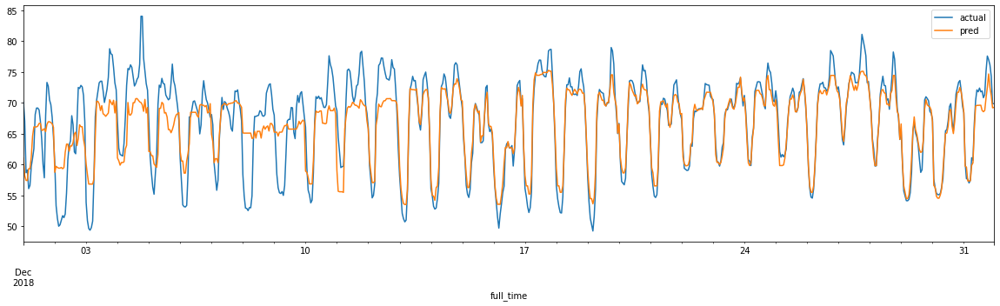

In [64]:
pred_df=pd.DataFrame({"actual":y_test,"pred":y_pred}).set_index(test["full_time"])

pred_df[["actual","pred"]].plot(figsize=(20,5));

In [65]:
#fig = go.Figure()
#fig.add_trace(go.Scatter(y=pred_df.actual,
 #                   mode='lines',
  #                  name='test'))
#fig.add_trace(go.Scatter(y=pred_df.pred,
 #                   mode='lines',
  #                  name='pred'))
#fig.update_xaxes(rangeslider_visible=True)
#fig.update_layout(title='Prediction Result',
 #                  xaxis_title='Date',
  #                 yaxis_title='Production')
#fig.show()

In [66]:
#plot_metric(evals_result,dpi=100);
#print("Best Iteration :", model.best_iteration)

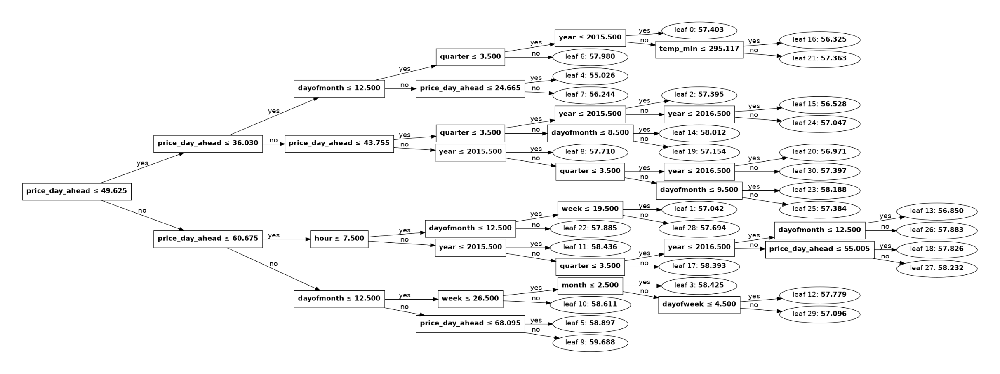

In [67]:
plot_tree(model,dpi=500,tree_index=0);

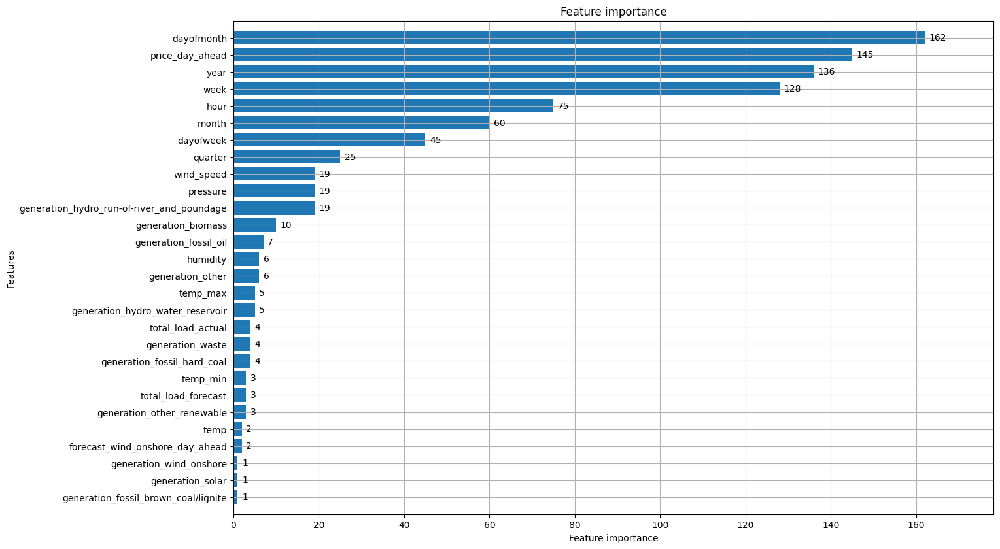

In [68]:
plot_importance(booster=model,
                height=0.8,
                figsize=(15,10),
                dpi=100);

In [69]:
#model=LGBMRegressor(random_state=0,
 #                   num_iterations=21
  #                  ).fit(X_train_t,y_train)

#perm = PermutationImportance(model, random_state=0).fit(X_test_t,y_test)
#eli5.show_weights(perm, feature_names = X_test_t.columns.tolist(),top=20)

# TimeSeriesSplit Cross Validation 

In [70]:
params = {
    'boosting_type':'gbdt',
    'objective': 'regression',
    'metric': ['mape','rmse'],
    
}

tscv=TimeSeriesSplit(n_splits=5)
full_df=pd.concat([X_train_t,y_train],axis=1)
X=full_df.drop(["price actual"],axis=1)
y=full_df["price actual"]
scores=[]

for train_index, test_index in tscv.split(X):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X.loc[train_index], X.loc[test_index]
    y_train, y_test = y.loc[train_index], y.loc[test_index]
    
    model=LGBMRegressor(random_state=0,metric=['rmse']) 
    train = lgb.Dataset(X_train,y_train)
    val = lgb.Dataset(X_test,y_test,reference=train)
    #print('Train and Validate')
    model = lgb.train(params=params,train_set=train,valid_sets=val,
                           num_boost_round=1000,verbose_eval=10,early_stopping_rounds=50)
    score=model.best_score.items()
    scores.append(score)
    
print("Best Scores: ",scores)

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5705
[LightGBM] [Info] Number of data points in the train set: 5720, number of used features: 39
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 61.721657
Training until validation scores don't improve for 50 rounds
[10]	valid_0's mape: 0.316713	valid_0's rmse: 13.8142
[20]	valid_0's mape: 0.271953	valid_0's rmse: 12.7148
[30]	valid_0's mape: 0.257247	valid_0's rmse: 12.5032
[40]	valid_0's mape: 0.250032	valid_0's rmse: 12.392
[50]	valid_0's mape: 0.245602	valid_0's rmse: 12.3225
[60]	valid_0's mape: 0.246538	valid_0's rmse: 12.4076
[70]	valid_0's mape: 0.24617	valid_0's rmse: 12.4187
[80]	valid_0's mape: 0.24602	valid_0's rmse: 12.4176
[90]	

# Feaure Engineering and New Model

In [71]:
full_data=pd.concat([train_new,test_new])  
full_data.head()

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_main,weather_description,year,quarter,month,week,hour,dayofweek,dayofmonth,is_weekend,total load actual_NA,generation biomass_NA,generation fossil oil_NA,generation hydro pumped storage consumption_NA,generation hydro run-of-river and poundage_NA,generation waste_NA,generation fossil brown coal/lignite_NA,generation fossil gas_NA,generation fossil hard coal_NA,generation hydro water reservoir_NA,generation other_NA,generation other renewable_NA,generation solar_NA,generation wind onshore_NA,generation nuclear_NA
0,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,17.0,6436.0,26118.0,25385.0,50.10,65.41,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,clear,sky is clear,2015,1,1,1,0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,16.0,5856.0,24934.0,24382.0,48.10,64.92,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,clear,sky is clear,2015,1,1,1,1,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,8.0,5454.0,23515.0,22734.0,47.33,64.48,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,clear,sky is clear,2015,1,1,1,2,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,2.0,5151.0,22642.0,21286.0,42.27,59.32,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,clear,sky is clear,2015,1,1,1,3,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,9.0,4861.0,21785.0,20264.0,38.41,56.04,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,clear,sky is clear,2015,1,1,1,4,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [72]:
full_data.shape

(35064, 56)

In [73]:
#full_data["price(t-1)"]=full_data["price actual"].shift(1)
#full_data["price(t-2)"]=full_data["price actual"].shift(2)
#full_data["price(t-3)"]=full_data["price actual"].shift(3)
#full_data["price(t-4)"]=full_data["price actual"].shift(4)
#full_data["price(t-5)"]=full_data["price actual"].shift(5)
#full_data["price(t-6)"]=full_data["price actual"].shift(6)
#full_data["price(t-12)"]=full_data["price actual"].shift(12)

full_data["price(t-12)"]=full_data["price actual"].shift(12)
full_data["price(t-24)"]=full_data["price actual"].shift(36)
full_data["price(t-36)"]=full_data["price actual"].shift(48)
full_data["price(t-48)"]=full_data["price actual"].shift(48)
full_data["price(t-72)"]=full_data["price actual"].shift(72)
full_data["price(t-168)"]=full_data["price actual"].shift(168)

full_data["price(t-12)"].fillna(method="bfill",inplace=True)
full_data["price(t-36)"].fillna(method="bfill",inplace=True)
full_data["price(t-24)"].fillna(method="bfill",inplace=True)
full_data["price(t-48)"].fillna(method="bfill",inplace=True)
full_data["price(t-72)"].fillna(method="bfill",inplace=True)
full_data["price(t-168)"].fillna(method="bfill",inplace=True)

full_data["diff_forecast"]=full_data["total load actual"] - full_data["total load forecast"]

full_data["roll_price_4"]=full_data["price actual"].rolling(window=4).mean()
full_data["roll_price_6"]=full_data["price actual"].rolling(window=6).mean()
full_data["roll_price_12"]=full_data["price actual"].rolling(window=12).mean()
full_data["roll_price_24"]=full_data["price actual"].rolling(window=24).mean()
full_data["roll_price_48"]=full_data["price actual"].rolling(window=48).mean()

full_data["roll_price_24_min"]=full_data["price actual"].rolling(window=24).min()
full_data["roll_price_12_min"]=full_data["price actual"].rolling(window=12).min()
full_data["roll_price_24_max"]=full_data["price actual"].rolling(window=24).max()
full_data["roll_price_12_max"]=full_data["price actual"].rolling(window=12).max()

full_data["roll_price_4"].fillna(method="bfill",inplace=True)
full_data["roll_price_6"].fillna(method="bfill",inplace=True)
full_data["roll_price_12"].fillna(method="bfill",inplace=True)
full_data["roll_price_24"].fillna(method="bfill",inplace=True)
full_data["roll_price_48"].fillna(method="bfill",inplace=True)

full_data["roll_price_24_min"].fillna(method="bfill",inplace=True)
full_data["roll_price_12_min"].fillna(method="bfill",inplace=True)
full_data["roll_price_24_max"].fillna(method="bfill",inplace=True)
full_data["roll_price_12_max"].fillna(method="bfill",inplace=True)

In [74]:
full_data.shape

(35064, 72)

In [75]:
full_data.tail()

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_main,weather_description,year,quarter,month,week,hour,dayofweek,dayofmonth,is_weekend,total load actual_NA,generation biomass_NA,generation fossil oil_NA,generation hydro pumped storage consumption_NA,generation hydro run-of-river and poundage_NA,generation waste_NA,generation fossil brown coal/lignite_NA,generation fossil gas_NA,generation fossil hard coal_NA,generation hydro water reservoir_NA,generation other_NA,generation other renewable_NA,generation solar_NA,generation wind onshore_NA,generation nuclear_NA,price(t-12),price(t-24),price(t-36),price(t-48),price(t-72),price(t-168),diff_forecast,roll_price_4,roll_price_6,roll_price_12,roll_price_24,roll_price_48,roll_price_24_min,roll_price_12_min,roll_price_24_max,roll_price_12_max
35059,297.0,0.0,7634.0,2628.0,178.0,1.0,1135.0,4836.0,6073.0,63.0,95.0,85.0,277.0,3113.0,96.0,3253.0,30619.0,30653.0,68.85,77.02,285.64,285.15,286.15,1028,62,2,140,0.0,0.0,0.0,0,clear,sky is clear,2018,4,12,1,19,0,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,60.70,56.35,71.01,71.01,77.10,75.30,34.0,75.2800,73.986667,72.420000,68.245833,66.168958,57.04,66.64,77.61,77.61
35060,296.0,0.0,7241.0,2566.0,174.0,1.0,1172.0,3931.0,6074.0,62.0,95.0,33.0,280.0,3288.0,51.0,3353.0,29932.0,29735.0,68.40,76.16,283.14,282.15,284.15,1029,71,1,242,0.0,0.0,0.0,0,clear,sky is clear,2018,4,12,1,20,0,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,66.64,57.70,70.72,70.72,73.60,74.95,-197.0,76.4800,74.688333,73.213333,68.362917,66.282292,57.04,70.33,77.61,77.61
35061,292.0,0.0,7025.0,2422.0,168.0,50.0,1148.0,2831.0,6076.0,61.0,94.0,31.0,286.0,3503.0,36.0,3404.0,27903.0,28071.0,66.88,74.30,281.66,281.15,282.15,1029,81,3,300,0.0,0.0,0.0,0,clear,sky is clear,2018,4,12,1,21,0,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,70.33,61.77,70.34,70.34,69.21,73.16,168.0,76.2725,75.263333,73.544167,68.390417,66.364792,57.04,70.85,77.61,77.61
35062,293.0,0.0,6562.0,2293.0,163.0,108.0,1128.0,2068.0,6075.0,61.0,93.0,31.0,287.0,3586.0,29.0,3273.0,25450.0,25801.0,63.93,69.89,280.14,279.15,281.15,1029,81,2,310,0.0,0.0,0.0,0,clear,sky is clear,2018,4,12,1,22,0,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,72.12,65.50,68.65,68.65,67.53,70.39,351.0,74.3425,75.018333,73.358333,68.305833,66.390625,57.04,69.89,77.61,77.61
35063,290.0,0.0,6926.0,2166.0,163.0,108.0,1069.0,1686.0,6075.0,61.0,92.0,31.0,287.0,3651.0,26.0,3117.0,24424.0,24455.0,64.27,69.88,279.14,278.15,280.15,1029,75,2,300,0.0,0.0,0.0,0,clear,sky is clear,2018,4,12,1,23,0,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,71.81,65.67,68.31,68.31,64.08,70.20,31.0,72.5575,74.143333,73.197500,68.322083,66.423333,57.04,69.88,77.61,77.61


In [76]:
columns_to_use=["generation biomass",
                "generation fossil brown coal/lignite",
                "generation fossil gas",
               "generation fossil hard coal",
                "generation fossil oil",
                "generation hydro pumped storage consumption",
                "generation hydro run-of-river and poundage",
                "generation hydro water reservoir","generation nuclear",
                "generation other renewable",
                "generation waste",
                "forecast solar day ahead",
                "price day ahead",
                "forecast wind onshore day ahead",
                "total load actual",
                "temp_min",
                "pressure",
                "humidity",
                "wind_speed",
                "wind_deg",
                "rain_1h",
                "rain_3h",
                "snow_3h",
                "clouds_all",
                "weather_main",
                "weather_description",
                "hour",
                "dayofweek",
                "dayofmonth",
                "is_weekend",
                "price(t-12)",
                  'price(t-168)',
                'diff_forecast',
                "week",
                 "roll_price_24_min",
                "price(t-72)",
                'roll_price_6',
            
                "price actual"
               ]
    

In [77]:
train_=full_data[columns_to_use].iloc[:34320,:]
test_=full_data[columns_to_use].iloc[34320:,:]

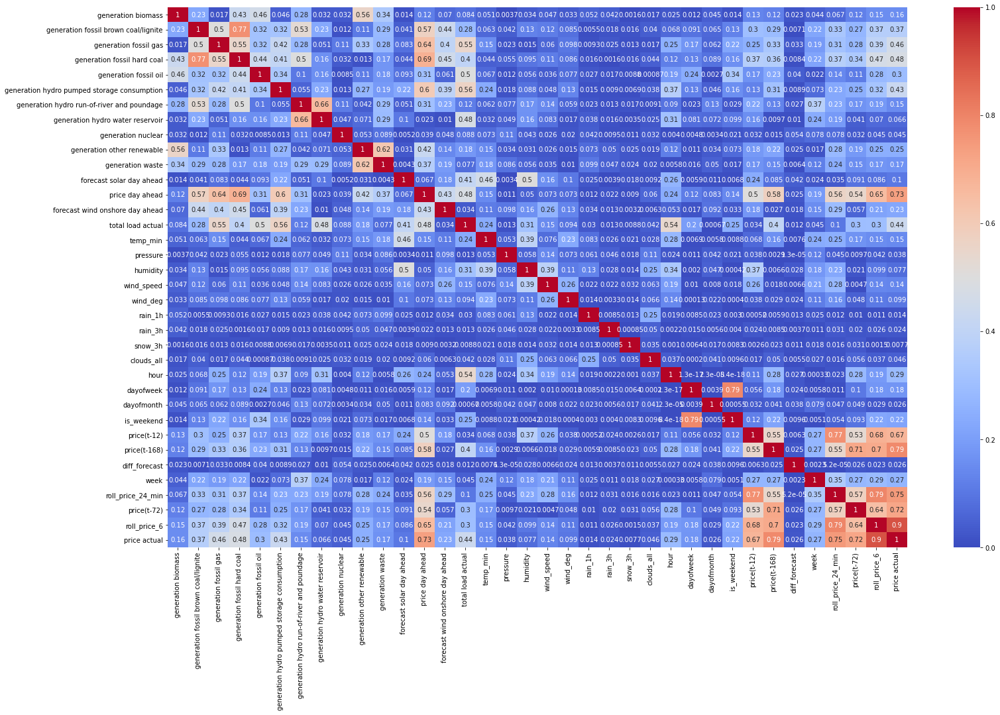

In [78]:
plt.figure(figsize=(25,15));
sns.heatmap(train_.corr().abs(),annot=True,cmap="coolwarm");

In [79]:
X_train=train_.drop(["price actual"],axis=1)
y_train=train_["price actual"]

X_test=test_.drop(["price actual"],axis=1)
y_test=test_["price actual"]


encoder = OrdinalEncoder(encoding_method='arbitrary', variables=['weather_main',"weather_description"])
#encoder=OneHotEncoder(variables=['weather_main',"weather_description"])
encoder.fit(X_train, y_train)

X_train = encoder.transform(X_train)
X_test = encoder.transform(X_test)

In [80]:
params = {
    'boosting_type':'gbdt',
    'objective': 'regression',
    'metric': ['mape','rmse'],
    "num_iterations":26,
    "feature_fraction":0.9,
    "reg_lambda":300,
    "bagging_fraction":0.8,
    }
full_train=lgb.Dataset(X_train,y_train)
model=lgb.train(params,full_train,num_boost_round=10,verbose_eval=10)

pred_train=model.predict(X_train)
pred_test=model.predict(X_test)

display(result_df(pred_train,y_train))

display(result_df(pred_test,y_test))

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002753 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6070
[LightGBM] [Info] Number of data points in the train set: 34320, number of used features: 36
[LightGBM] [Info] Start training from score 57.685480


,r2,MSE,RMSE,MAE,MAPE
0,0.886423,16.337011,4.041907,2.784808,5.35077


,r2,MSE,RMSE,MAE,MAPE
0,0.871915,5.280645,2.297965,1.727752,2.624864


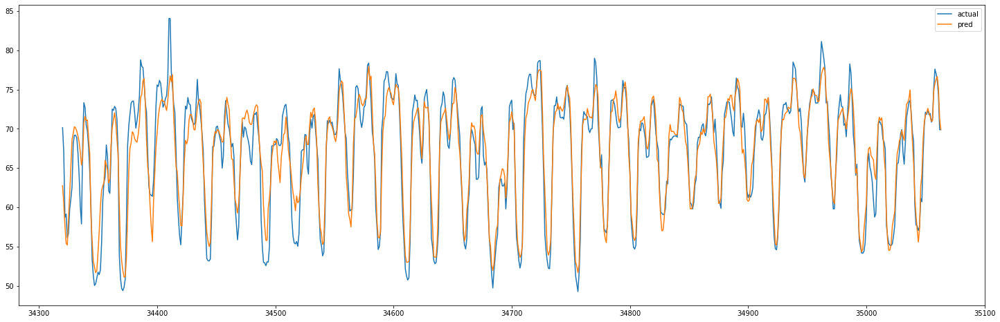

In [81]:
pred_df=pd.DataFrame({"actual":y_test,"pred":pred_test})

pred_df[["actual","pred"]].plot(figsize=(25,8));

In [82]:
pred_df.head(10)

,actual,pred
34320,70.14,62.751956
34321,67.05,60.454088
34322,58.69,57.668781
34323,59.14,55.431609
34324,56.12,55.185234
34325,56.63,58.507480
34326,59.72,61.603358
34327,61.06,65.144064
34328,62.59,68.612812
34329,68.12,69.395874


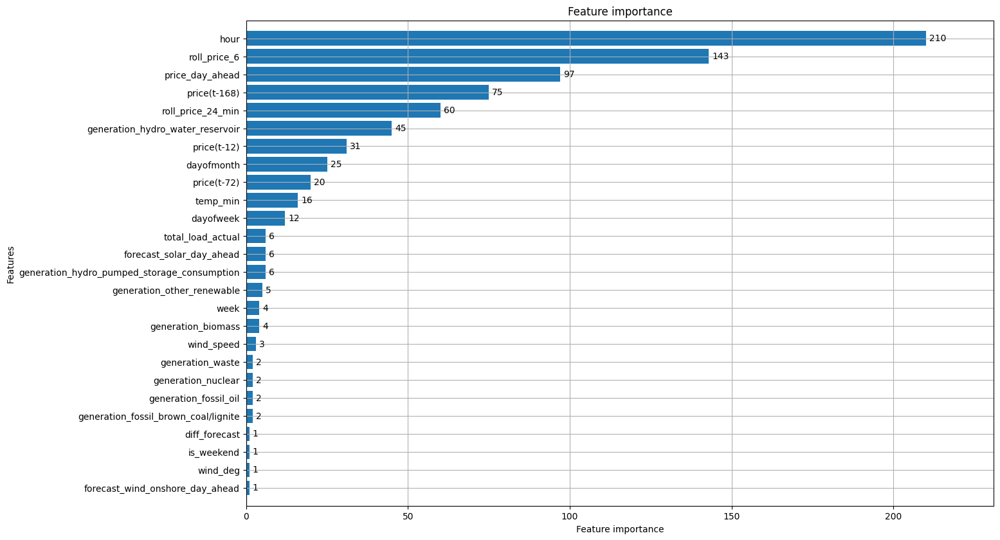

In [83]:
plot_importance(booster=model,
                height=0.8,
                figsize=(15,10),
                dpi=100);

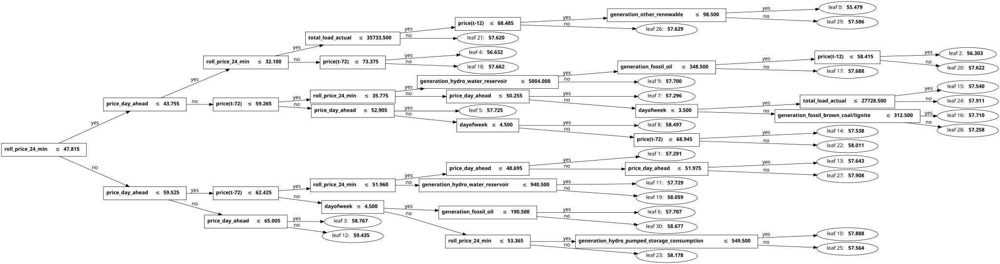

In [84]:
create_tree_digraph(model)

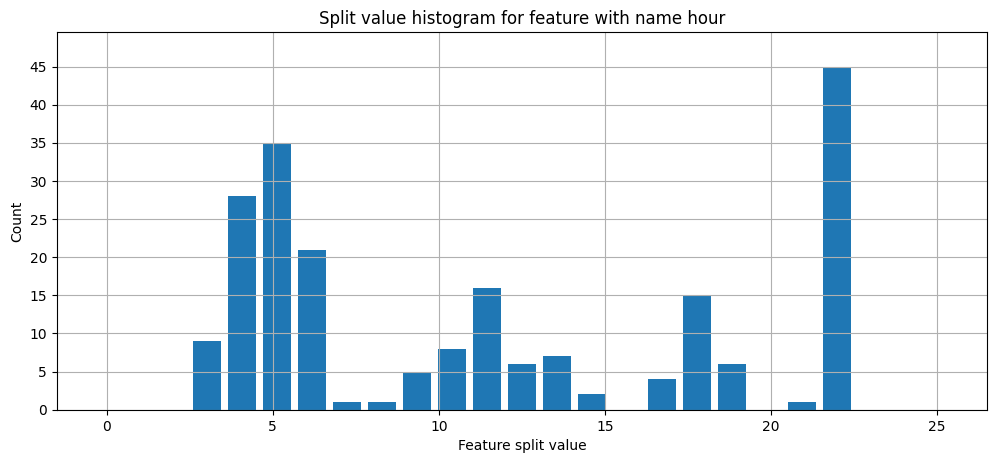

In [85]:
lgb.plot_split_value_histogram(model,feature="hour",figsize=(12,5),dpi=100);

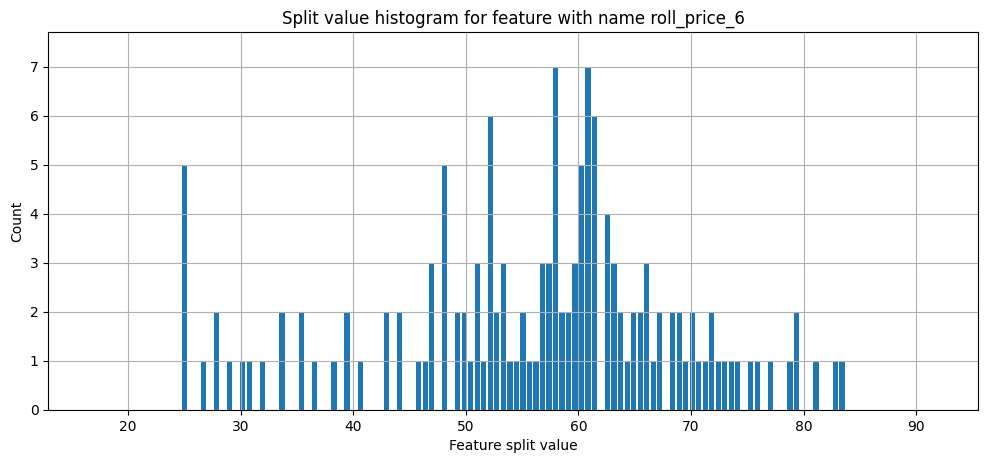

In [86]:
lgb.plot_split_value_histogram(model,feature="roll_price_6",figsize=(12,5),dpi=100);

In [87]:
shap.initjs()

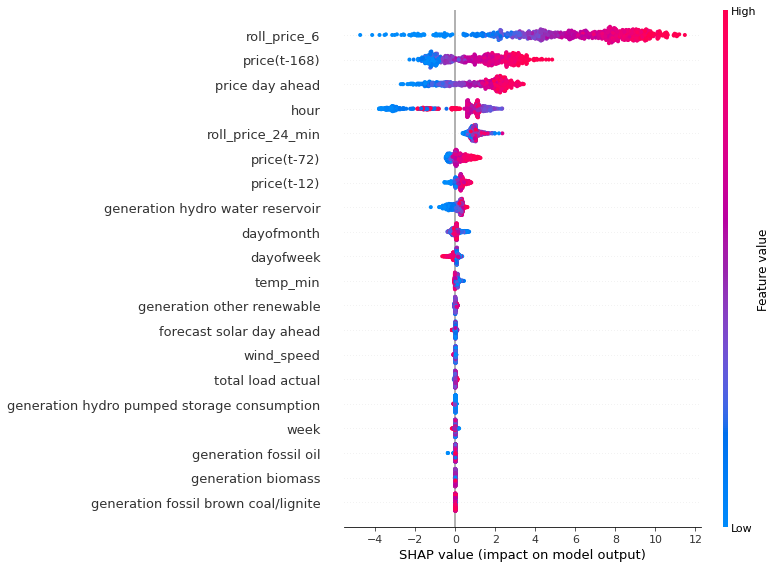

In [88]:
explainer = shap.TreeExplainer(model)

shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test)

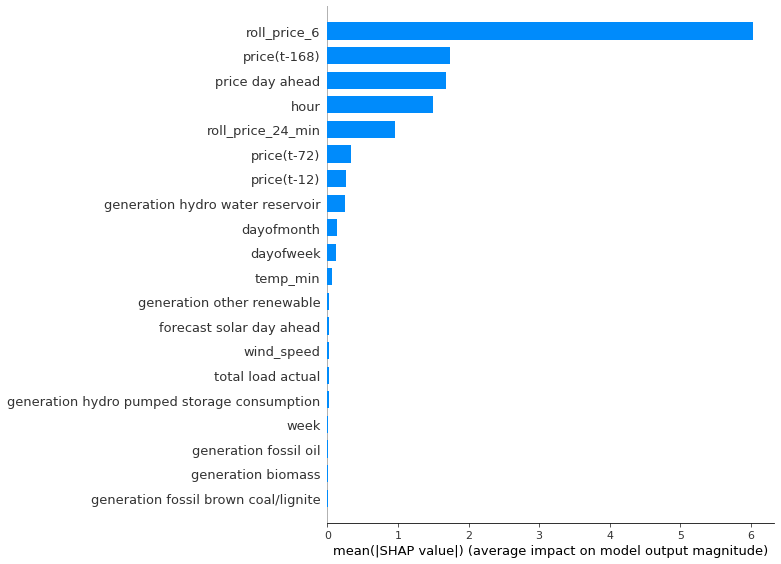

In [89]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

In [90]:
shap.force_plot(explainer.expected_value, shap_values, X_test)